In [3]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
import tensorflow_hub as hub
from sklearn.metrics import confusion_matrix,classification_report
import tqdm


In [4]:
NUM_BONE_TYPES = 12
IMAGE_SIZE = (160, 160)
batch_size = 32

In [5]:
df = pd.read_csv(r"C:\gradution file\train_image_paths.csv")
df.columns = ['paths']
paths = df.paths.to_list()
df2 = pd.read_csv(r"C:\gradution file\labels.csv")
df2 = df2[['Image','labels']]
print(df2,df)


     Image  labels
0     1001       1
1     1002       1
2     1003       0
3     1004       0
4     1005       1
..     ...     ...
163   1169       1
164   1170       1
165   1171       0
166   1172       0
167   1173       1

[168 rows x 2 columns]                                                    paths
0      MURA-v1.1/train/XR_SHOULDER/patient00001/study...
1      MURA-v1.1/train/XR_SHOULDER/patient00001/study...
2      MURA-v1.1/train/XR_SHOULDER/patient00001/study...
3      MURA-v1.1/train/XR_SHOULDER/patient00002/study...
4      MURA-v1.1/train/XR_SHOULDER/patient00002/study...
...                                                  ...
36803  MURA-v1.1/train/XR_HAND/patient11183/study1_ne...
36804  MURA-v1.1/train/XR_HAND/patient11183/study1_ne...
36805  MURA-v1.1/train/XR_HAND/patient11184/study1_ne...
36806  MURA-v1.1/train/XR_HAND/patient11184/study1_ne...
36807  MURA-v1.1/train/XR_HAND/patient11184/study1_ne...

[36808 rows x 1 columns]


In [6]:
Images_Ankle_frac = [1002,1012,1019,1023,1025,1028,1031,1036,1037,1044,1051,1062,1092,1104,1125,1126,1128,1134,1138,1142,1159,1162,1167]
Images_Ankle_frac = [str(image) for image in Images_Ankle_frac]
Images_foot_frac = [1047,1049,1054,1055,1060,1065,1086,1091,1101,1106,1107,1114,1120,1137,1140,1141,1143,1146,1148,1149,1153,1163,1168,1170,1173]
Images_foot_frac = [str(image) for image in Images_foot_frac]
Images_hip_frac = [1007,1021,1022,1032,1039,1043,1072,1080,1093,1103,1129,1135,1136,1145,1150,1152,1154,1158,1160,1161]
Images_hip_frac = [str(image) for image in Images_hip_frac]
Images_knee_frac =[1001,1005,1008,1017,1018,1020,1040,1041,1048,1068,1069,1075,1076,1084,1088,1095,1111,1115,1117,1118,1122,1123,1124,1130,1144,1157,1169]
Images_knee_frac = [str(image) for image in Images_knee_frac]
Images_ankle_norm = [1003,1004,1010,1011,1013,1024,1026,1027,1029,1035,1050,1052,1063,1071,1073,1082,1087,1096,1099,1100,1105,1116,1131]
Images_ankle_norm =[str(image) for image in Images_ankle_norm]
Images_foot_norm = [1046,1056,1059,1064,1067,1070,1077,1085,1089,1098,1108,1109,1119,1132,1133,1139,1151,1156,1164,1166]
Images_foot_norm =[str(image) for image in Images_foot_norm]
Images_hip_norm = [1006,1016,1030,1038,1045,1057,1058,1061,1078,1081,1083,1102,1127]
Images_hip_norm =[str(image) for image in Images_hip_norm]
Images_knee_norm = [1009,1014,1015,1033,1042,1053,1066,1074,1079,1090,1094,1110,1113,1121,1147,1171,1172]
Images_knee_norm = [str(image) for image in Images_knee_norm]
Normal_bones = np.concatenate((Images_ankle_norm,Images_foot_norm,Images_hip_norm,Images_knee_norm))
frac_bones = np.concatenate((Images_Ankle_frac,Images_foot_frac,Images_hip_frac,Images_knee_frac))
print(frac_bones,Normal_bones)

['1002' '1012' '1019' '1023' '1025' '1028' '1031' '1036' '1037' '1044'
 '1051' '1062' '1092' '1104' '1125' '1126' '1128' '1134' '1138' '1142'
 '1159' '1162' '1167' '1047' '1049' '1054' '1055' '1060' '1065' '1086'
 '1091' '1101' '1106' '1107' '1114' '1120' '1137' '1140' '1141' '1143'
 '1146' '1148' '1149' '1153' '1163' '1168' '1170' '1173' '1007' '1021'
 '1022' '1032' '1039' '1043' '1072' '1080' '1093' '1103' '1129' '1135'
 '1136' '1145' '1150' '1152' '1154' '1158' '1160' '1161' '1001' '1005'
 '1008' '1017' '1018' '1020' '1040' '1041' '1048' '1068' '1069' '1075'
 '1076' '1084' '1088' '1095' '1111' '1115' '1117' '1118' '1122' '1123'
 '1124' '1130' '1144' '1157' '1169'] ['1003' '1004' '1010' '1011' '1013' '1024' '1026' '1027' '1029' '1035'
 '1050' '1052' '1063' '1071' '1073' '1082' '1087' '1096' '1099' '1100'
 '1105' '1116' '1131' '1046' '1056' '1059' '1064' '1067' '1070' '1077'
 '1085' '1089' '1098' '1108' '1109' '1119' '1132' '1133' '1139' '1151'
 '1156' '1164' '1166' '1006' '1016' '103

In [7]:
import os

base_dir = r"C:\Graduation Project Data\SuperSetDataSet\Train"
categories = ['ANKLE','ELBOW','FINGER','FOOT','FOREARM','HAND','HIP','HUMERUS','KNEE','SHOULDER','WRIST']
Images_train = []
for category in categories:
    category_dir = os.path.join(base_dir, category)
    
    for number_folder in os.listdir(category_dir):
        number_folder_path = os.path.join(category_dir, number_folder)
        if os.path.isdir(number_folder_path):
            for i in os.listdir(number_folder_path):
                st_folder = os.path.join(number_folder_path, i)
                if os.path.isdir(st_folder):
                    for image_file in os.listdir(st_folder):
                        image_path = os.path.join(st_folder, image_file)
                        print("Category:", category, "| Number Folder:", number_folder, "| Image Path:", image_path)
                        Images_train.append(image_path)


Category: ANKLE | Number Folder: 1012 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Train\ANKLE\1012\ST-1\0.png
Category: ANKLE | Number Folder: 1012 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Train\ANKLE\1012\ST-1\0_0_1145.png
Category: ANKLE | Number Folder: 1012 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Train\ANKLE\1012\ST-1\0_0_122.png
Category: ANKLE | Number Folder: 1012 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Train\ANKLE\1012\ST-1\0_0_125.png
Category: ANKLE | Number Folder: 1012 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Train\ANKLE\1012\ST-1\0_0_1296.png
Category: ANKLE | Number Folder: 1012 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Train\ANKLE\1012\ST-1\0_0_1410.png
Category: ANKLE | Number Folder: 1012 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Train\ANKLE\1012\ST-1\0_0_1429.png
Category: ANKLE | Number Folder: 1012 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Trai

In [9]:
import os

base_dir = r"C:\Graduation Project Data\SuperSetDataSet\Valid"
categories = ['ANKLE','ELBOW','FINGER','FOOT','FOREARM','HAND','HIP','HUMERUS','KNEE','SHOULDER','WRIST']
Images_valid = []
for category in categories:
    category_dir = os.path.join(base_dir, category)
    
    for number_folder in os.listdir(category_dir):
        number_folder_path = os.path.join(category_dir, number_folder)
        if os.path.isdir(number_folder_path):
            for i in os.listdir(number_folder_path):
                st_folder = os.path.join(number_folder_path, i)
                if os.path.isdir(st_folder):
                    for image_file in os.listdir(st_folder):
                        image_path = os.path.join(st_folder, image_file)
                        print("Category:", category, "| Number Folder:", number_folder, "| Image Path:", image_path)
                        Images_valid.append(image_path)


Category: ANKLE | Number Folder: 1002 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Valid\ANKLE\1002\ST-1\0.png
Category: ANKLE | Number Folder: 1002 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Valid\ANKLE\1002\ST-1\2.png
Category: ANKLE | Number Folder: 1002 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Valid\ANKLE\1002\ST-1\3.png
Category: ANKLE | Number Folder: 1003 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Valid\ANKLE\1003\ST-1\0.png
Category: ANKLE | Number Folder: 1003 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Valid\ANKLE\1003\ST-1\2.png
Category: ANKLE | Number Folder: 1003 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Valid\ANKLE\1003\ST-1\4.png
Category: ANKLE | Number Folder: 1004 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Valid\ANKLE\1004\ST-1\0.png
Category: ANKLE | Number Folder: 1004 | Image Path: C:\Graduation Project Data\SuperSetDataSet\Valid\ANKLE\1004\ST-1\1.png
Category: ANKLE 

In [10]:
print(len(Images_train),len(Images_valid))
labels_train = np.ones((len(Images_train), 1))
labels_valid = np.ones((len(Images_valid), 1))
print(labels_valid.shape,labels_train.shape)

print(labels_train[222])
def leraLabels(Imagepaths_train,Imagepaths_valid,labelsTrain,labelsValid,abnormal):
    
    for i in range(len(Imagepaths_train)):
        for j in abnormal:
            if j in Imagepaths_train[i]:
                labelsTrain[i] = 1
                break
            elif 'positive' in Imagepaths_train[i]:
                labelsTrain[i] = 1
            else:
               labelsTrain[i] = 0

    for i in range(len(Imagepaths_valid)):
        for j in abnormal:
            if j in Imagepaths_valid[i]:
                labelsValid[i] = 1
                break
            elif 'positive' in Imagepaths_valid[i]:
                labelsValid[i] = 1
            else:
                labelsValid[i] = 0
    return labelsTrain,labelsValid

Fracture_labels_train,Fracture_labels_valid = leraLabels(Images_train,Images_valid,labels_train,labels_valid,frac_bones)

56935 3371
(3371, 1) (56935, 1)
[1.]


In [12]:
print(Fracture_labels_train[10524],Fracture_labels_valid.shape)

def LabelingTrain():
    x = np.empty((0, 160, 160, 3), dtype=np.float32)
    y = np.empty((0, 11), dtype=np.float32)
    x_eight = np.empty((0, 160, 160, 3), dtype=np.float32)
    y_eight = np.empty((0, 11), dtype=np.float32)

    datagen = ImageDataGenerator(rescale=1./255)
    extract_path = r"C:\Graduation Project Data\SuperSetDataSet\Train"
    train_generator = datagen.flow_from_directory(
        extract_path,
        target_size=(160, 160),
        class_mode='categorical',
        shuffle=True
    )
    num_batches = len(train_generator)
    batch_shape = None

    # Loop over first 1000 batches
    for i in tqdm.tqdm(range(1000)):
        x_train, y_train = next(train_generator)
        if batch_shape is None:
            batch_shape = x_train.shape
        if x_train.shape == batch_shape:
            x = np.concatenate((x, x_train), axis=0)
            y = np.concatenate((y, y_train), axis=0)

    # Loop over remaining batches
    for j in tqdm.tqdm(range(1000, num_batches)):
        x_train, y_train = next(train_generator)
        if batch_shape is None:
            batch_shape = x_train.shape
        if x_train.shape == batch_shape:
            x_eight = np.concatenate((x_eight, x_train), axis=0)
            y_eight = np.concatenate((y_eight, y_train), axis=0)
        else:
            x_eight = np.concatenate((x_eight, x_train), axis=0)
            y_eight = np.concatenate((y_eight, y_train), axis=0)
    
    x_Train = np.concatenate([x, x_eight])
          
    indices_train = train_generator.index_array


    return x_Train, y, y_eight,indices_train


def LabelingValid():
  x = np.empty((0,) + (160,160) + (3,), dtype=np.float32)
  y = np.empty((0,11), dtype=np.float32)

  x_eight = np.empty((0,) + (160,160) + (3,), dtype=np.float32)
  #y = []
  y_eight = np.empty((0,11) , dtype=np.float32)
  datagen = ImageDataGenerator(rescale=1./255)
  extract_path = r"C:\Graduation Project Data\SuperSetDataSet\Valid"
  valid_generator = datagen.flow_from_directory(
            extract_path,
            target_size = (160, 160),
            class_mode='categorical',
            shuffle=True
  )
  num_batches = len(valid_generator)
  batch_shape = None

  for i in range(num_batches):
    x_train, y_train = next(valid_generator)
    if batch_shape is None:
           batch_shape = x_train.shape
    if x_train.shape == batch_shape:
       x = np.concatenate((x, x_train), axis=0)
       y = np.concatenate((y, y_train), axis=0)
    else:
       x_eight = np.concatenate((x_eight, x_train), axis=0)
       y_eight = np.concatenate((y_eight, y_train), axis=0)
  

  indices_valid = valid_generator.index_array
  return x, y, x_eight, y_eight,indices_valid


[0.] (3371, 1)


In [13]:
x_train,y_train,y_temp_train,fracture_y_train = LabelingTrain()


Found 56935 images belonging to 11 classes.


100%|██████████| 780/780 [43:41<00:00,  3.36s/it]


In [14]:
print(x_train.shape,y_train.shape,y_temp_train.shape)
print(fracture_y_train)
New_Labels = Fracture_labels_train[fracture_y_train]
merged_labelstemp_train = np.concatenate([y_train, y_temp_train])
y_Train = np.concatenate([merged_labelstemp_train, New_Labels], axis=1)

x_valid,y_valid,x_temp_valid,y_temp_valid,fracture_y_valid = LabelingValid()
New_Labels_valid = Fracture_labels_valid[fracture_y_valid]
merged_labelstemp = np.concatenate([y_valid, y_temp_valid])
y_Test = np.concatenate([merged_labelstemp, New_Labels_valid], axis=1)
x_Test = np.concatenate([x_valid, x_temp_valid])



(56935, 160, 160, 3) (32000, 11) (24935, 11)
[37439  5980 13591 ... 48119 48484 49222]
Found 3371 images belonging to 11 classes.


In [ ]:
print(fracture_y_train)
print(fracture_y_valid)

[ 650 1178 1793 ...  137  401 2676]


(56936, 160, 160, 3) (56936, 12)
(3371, 12) (3371, 160, 160, 3)
[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


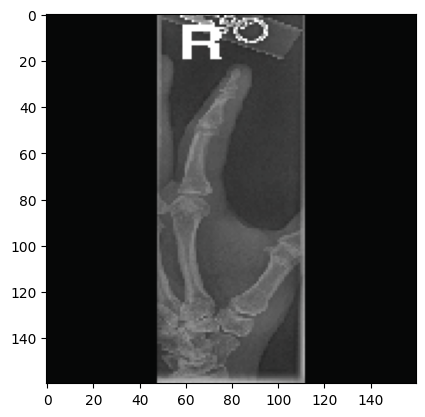

In [ ]:
print(x_train.shape,y_Train.shape)
print(y_Test.shape,x_Test.shape)
print(y_Train[1])
plt.imshow(x_train[1])
print(y_Test[0])
plt.imshow(x_Test[0])

In [15]:
def data_generator(data_list, labels_list, batch_size):
    num_samples = len(data_list)

    while True:
        # Shuffle the data and labels at the start of each epoch
        combined_data = list(zip(data_list, labels_list))
        np.random.shuffle(combined_data)
        data_shuffled, labels_shuffled = zip(*combined_data)

        # Generate batches
        for i in range(0, num_samples, batch_size):
            batch_data = np.array(data_shuffled[i:i+batch_size])  # Convert to numpy array
            batch_labels = np.array(labels_shuffled[i:i+batch_size])  # Convert to numpy array
            yield batch_data, batch_labels



generator = data_generator(x_train, y_Train, 32)
# Train the model using the generator
# model.fit(generator, steps_per_epoch=len(data_list), epochs=num_epochs)


In [16]:

from tensorflow.keras.applications import InceptionV3

input_shape = (160, 160, 3)

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape= input_shape)


base_model.trainable = True


global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

prediction_layer = tf.keras.layers.Dense(NUM_BONE_TYPES, activation='sigmoid')

model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    prediction_layer
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])


history = model.fit(generator, epochs = 15 , validation_data=(x_Test, y_Test), steps_per_epoch=len(x_train) // 32)

Epoch 1/15
1779/1779 ━━━━━━━━━━━━━━━━━━━━ 7082s 4s/step - accuracy: 0.8134 - loss: 0.1165 - val_accuracy: 0.8991 - val_loss: 0.1460
Epoch 2/15
1779/1779 ━━━━━━━━━━━━━━━━━━━━ 5176s 3s/step - accuracy: 0.9246 - loss: 0.0564 - val_accuracy: 0.8627 - val_loss: 0.1079
Epoch 3/15
1779/1779 ━━━━━━━━━━━━━━━━━━━━ 5124s 3s/step - accuracy: 0.9366 - loss: 0.0478 - val_accuracy: 0.8941 - val_loss: 0.0964
Epoch 4/15
1779/1779 ━━━━━━━━━━━━━━━━━━━━ 5239s 3s/step - accuracy: 0.9427 - loss: 0.0438 - val_accuracy: 0.9140 - val_loss: 0.1295
Epoch 5/15
1779/1779 ━━━━━━━━━━━━━━━━━━━━ 6036s 3s/step - accuracy: 0.9463 - loss: 0.0391 - val_accuracy: 0.9152 - val_loss: 0.1100
Epoch 6/15
1779/1779 ━━━━━━━━━━━━━━━━━━━━ 6197s 3s/step - accuracy: 0.9601 - loss: 0.0358 - val_accuracy: 0.9244 - val_loss: 0.1162
Epoch 7/15
1779/1779 ━━━━━━━━━━━━━━━━━━━━ 5342s 3s/step - accuracy: 0.9598 - loss: 0.0329 - val_accuracy: 0.9235 - val_loss: 0.1079
Epoch 8/15
1779/1779 ━━━━━━━━━━━━━━━━━━━━ 5354s 3s/step - accuracy: 0.9502 -

In [17]:
evaluation = model.evaluate(x_Test,y_Test)


106/106 ━━━━━━━━━━━━━━━━━━━━ 50s 475ms/step - accuracy: 0.8718 - loss: 0.1664


In [18]:
predictions = model.predict(x_Test)




106/106 ━━━━━━━━━━━━━━━━━━━━ 51s 451ms/step


In [22]:
from sklearn.metrics import multilabel_confusion_matrix

threeshold = 0.2
y_pred_binary = (predictions>threeshold).astype(int)
confMatrix=multilabel_confusion_matrix(y_Test,y_pred_binary)
for i , matrix in enumerate(confMatrix):

    print(f"Confusion Matrix (Mura and lera) for class {i+1}:")
    print(matrix)
print(classification_report(y_Test,y_pred_binary))

Confusion Matrix (Mura and lera) for class 1:
[[3324    4]
 [   7   36]]
Confusion Matrix (Mura and lera) for class 2:
[[2867   39]
 [  12  453]]
Confusion Matrix (Mura and lera) for class 3:
[[2902    8]
 [  22  439]]
Confusion Matrix (Mura and lera) for class 4:
[[3312   14]
 [   1   44]]
Confusion Matrix (Mura and lera) for class 5:
[[3042   28]
 [  56  245]]
Confusion Matrix (Mura and lera) for class 6:
[[2871   40]
 [   9  451]]
Confusion Matrix (Mura and lera) for class 7:
[[3342    1]
 [   3   25]]
Confusion Matrix (Mura and lera) for class 8:
[[3036   47]
 [  19  269]]
Confusion Matrix (Mura and lera) for class 9:
[[3313    0]
 [   5   53]]
Confusion Matrix (Mura and lera) for class 10:
[[2781   27]
 [   6  557]]
Confusion Matrix (Mura and lera) for class 11:
[[2682   30]
 [  18  641]]
Confusion Matrix (Mura and lera) for class 12:
[[ 481  369]
 [ 803 1718]]
              precision    recall  f1-score   support

           0       0.90      0.84      0.87        43
           1

c:\Users\Ahmed\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [24]:

model.save_weights(r'c:\incepttion weight\weights.weights.h5')


In [32]:
from keras.preprocessing import image
import numpy as np
import tensorflow as tf



# Load and preprocess the image
img_path = r"C:\ LURA DATA\ processed lera\ KNEE\ 1001\ST-1\ 0"
img = image.load_img(img_path, target_size=(400,400))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.  # Normalize the image

# Make predictions
probability_test = model.predict(img_array)

# Define classes
classes = ['ANKLE', 'ELBOW', 'FINGER', 'FOOT', 'FOREARM', 'HAND', 'HIP', 'HUMERUS', 'KNEE', 'SHOULDER', 'WRIST', 'Abnormality']

# Get top predicted classes
sorted_indices = np.argsort(probability_test[0])[::-1]

# Print top predictions
for i in range(12):
    print("Class: " + classes[sorted_indices[i]], "Probability: " + str(probability_test[0][sorted_indices[i]]))


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\ LURA DATA\\ processed lera\\ KNEE\\ 1001\\ST-1\\ 0'